In [1]:
import os
import sys
import pandas as pd
import numpy as np
import glob
import time
import gget
import scipy
from scipy.sparse import csr_matrix
import anndata as an
import scanpy as sc
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import networkx as nx
import random
from importlib import reload
import warnings
import ot
from scipy.spatial.distance import pdist, squareform
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable
from collections import Counter
import matplotlib.patches as patches

import surprise as sup

from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import MinMaxScaler

"""WARNING: no warnings"""
warnings.filterwarnings("ignore")

# local imports
import anndata_utils as anntools

source_path = os.path.abspath("../source/")
sys.path.append(source_path)
import centrality as central
import matrix
import utils as ut
import plotting as plt2

In [2]:
resolution = 1000000
chrom = "chr2"

dpath = "/scratch/indikar_root/indikar1/shared_data/higher_order/by_chromosome/"

file_list = sorted(glob.glob(f"{dpath}*_{resolution}_{chrom}*"))
population_path = file_list[0]
print(population_path)

start_time = time.time()  # Record the start time
adata = sc.read_h5ad(population_path)
end_time = time.time()  # Record the end time
print(f"Time taken to read the file: {end_time - start_time:.2f} seconds")
sc.logging.print_memory_usage()

# sort the object by global bin id
sorted_indices = adata.obs['bin'].argsort()
adata = adata[sorted_indices, :] 

adata

/scratch/indikar_root/indikar1/shared_data/higher_order/by_chromosome/population_mESC_1000000_chr2.h5ad
Time taken to read the file: 2.06 seconds
Memory usage: current 0.95 GB, difference +0.95 GB


View of AnnData object with n_obs × n_vars = 179 × 186499
    obs: 'bin_index', 'bin_start', 'bin_end', 'bin', 'chrom', 'chrom_bin', 'degree', 'genes', 'n_genes', 'ATACSeq_1', 'ATACSeq_2', 'ATACSeq_3', 'CTCF', 'H3K27ac', 'H3K27me3', 'RNA_1', 'RNA_2', 'RNA_3', 'RNA_4', 'RNA_5', 'RNA_6', 'chrom_degree'
    var: 'read_index', 'basename', 'mean_mapq', 'median_mapq', 'n_chromosomes', 'order', 'n_bins', 'read_length_bp', 'genes', 'n_genes', 'chrom_order'
    uns: 'base_resolution', 'chrom_sizes', 'gene_map'

# Merge in scores

In [3]:
fpath = f"/scratch/indikar_root/indikar1/shared_data/higher_order/core_scores/population_mESC_{resolution}_{chrom}.csv"
df = pd.read_csv(fpath)
print(f"{df.shape=}")

# drop outliers 
df = df.sort_values(by='bin')
columns_to_drop = [x for x in df.columns if x in adata.obs.columns]
df = df.drop(columns=columns_to_drop)
print(f"{df.shape=}")


adata.obs = pd.merge(
    adata.obs, df.set_index('bin_name'),
    how='left',
    left_index=True,
    right_index=True,
)

adata.obs.head()

df.shape=(176, 33)
df.shape=(176, 11)


,bin_index,bin_start,bin_end,bin,chrom,chrom_bin,degree,genes,n_genes,ATACSeq_1,...,degree_outlier,ce_singular_vector_1,ce_eigenvector_centrality,ce_betweenness_centrality,ce_pagerank,hge_singular_vector_1,hge_logexp_unweighted,hge_logexp_degree_weighted,hge_logexp_RNA_weighted,hge_logexp_ATAC_weighted
bin_name,,,,,,,,,,,,,,,,,,,,,
chr2:3,1456,3000000,4000000,199,2,3,3532,Rpp38;Suv39h2;Fam107b;Gm37525;Gm13182;Msantd7;...,23,0.628770,...,False,0.369323,0.369326,0.177194,0.379051,0.070189,0.736632,0.193565,0.431421,0.764822
chr2:4,2267,4000000,5000000,200,2,4,3706,Gm38348;Gm13193;Sephs1;Gm13189;Gm13179;Gm13192...,23,0.692131,...,False,0.418011,0.418013,0.049221,0.427527,0.105279,0.812910,0.301884,0.461788,0.821527
chr2:5,2533,5000000,6000000,201,2,5,3913,Nudt5;4930551O13Rik;Sec61a2;Ccdc3;Dhtkd1;Gm131...,14,0.798978,...,False,0.540510,0.540510,0.008203,0.530948,0.112710,0.806978,0.242750,0.272788,0.900004
chr2:6,1233,6000000,7000000,202,2,6,3469,Gm38386;Gm10115;Gm13384;Gm10855;Gm13389;Gm1339...,17,0.710963,...,False,0.522230,0.522232,0.080394,0.532509,0.181386,0.635947,0.414472,0.230090,0.823084
chr2:7,1800,7000000,8000000,203,2,7,3042,Gm13210;Gm13211;Celf2;Gm28641,4,0.479755,...,False,0.310584,0.310589,0.148482,0.333318,0.128580,0.662151,0.282449,0.020584,0.619104


In [4]:
def find_outliers_iqr(df_column):
  """
  Identifies outliers in a pandas DataFrame column using the IQR method.

  Args:
    df_column: A pandas Series representing the column to analyze.

  Returns:
    A boolean mask with True for outliers and False otherwise.
  """
  Q1 = df_column.quantile(0.15)
  Q3 = df_column.quantile(0.85)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  return (df_column < lower_bound) | (df_column > upper_bound)

adata.obs['degree_outlier'] = find_outliers_iqr(adata.obs['chrom_degree'])

# remove outliers
remove_bins = adata.obs[adata.obs['degree_outlier']].index.to_list()
print(f"Removing top {len(remove_bins)} outlier loci: ")
print(remove_bins)
adata = adata[~adata.obs_names.isin(remove_bins), :].copy()

print('done!')

Removing top 3 outlier loci: 
['chr2:98', 'chr2:177', 'chr2:181']
done!


In [5]:
# Clique_expand
matrix.expand_and_normalize_anndata(adata, oe_kr=False)
adata

Expanding input matrix...
Applying KR normalization...
Applying OE normalization...
Normalization complete.


AnnData object with n_obs × n_vars = 176 × 186499
    obs: 'bin_index', 'bin_start', 'bin_end', 'bin', 'chrom', 'chrom_bin', 'degree', 'genes', 'n_genes', 'ATACSeq_1', 'ATACSeq_2', 'ATACSeq_3', 'CTCF', 'H3K27ac', 'H3K27me3', 'RNA_1', 'RNA_2', 'RNA_3', 'RNA_4', 'RNA_5', 'RNA_6', 'chrom_degree', 'degree_outlier', 'ce_singular_vector_1', 'ce_eigenvector_centrality', 'ce_betweenness_centrality', 'ce_pagerank', 'hge_singular_vector_1', 'hge_logexp_unweighted', 'hge_logexp_degree_weighted', 'hge_logexp_RNA_weighted', 'hge_logexp_ATAC_weighted'
    var: 'read_index', 'basename', 'mean_mapq', 'median_mapq', 'n_chromosomes', 'order', 'n_bins', 'read_length_bp', 'genes', 'n_genes', 'chrom_order'
    uns: 'base_resolution', 'chrom_sizes', 'gene_map'
    obsm: 'A', 'A_kr', 'A_oe'

In [6]:
adata.obs.columns

Index(['bin_index', 'bin_start', 'bin_end', 'bin', 'chrom', 'chrom_bin',
       'degree', 'genes', 'n_genes', 'ATACSeq_1', 'ATACSeq_2', 'ATACSeq_3',
       'CTCF', 'H3K27ac', 'H3K27me3', 'RNA_1', 'RNA_2', 'RNA_3', 'RNA_4',
       'RNA_5', 'RNA_6', 'chrom_degree', 'degree_outlier',
       'ce_singular_vector_1', 'ce_eigenvector_centrality',
       'ce_betweenness_centrality', 'ce_pagerank', 'hge_singular_vector_1',
       'hge_logexp_unweighted', 'hge_logexp_degree_weighted',
       'hge_logexp_RNA_weighted', 'hge_logexp_ATAC_weighted'],
      dtype='object')

n core nodes: 44
node_size=(153.0434782608696,)
Graph with 176 nodes and 3872 edges


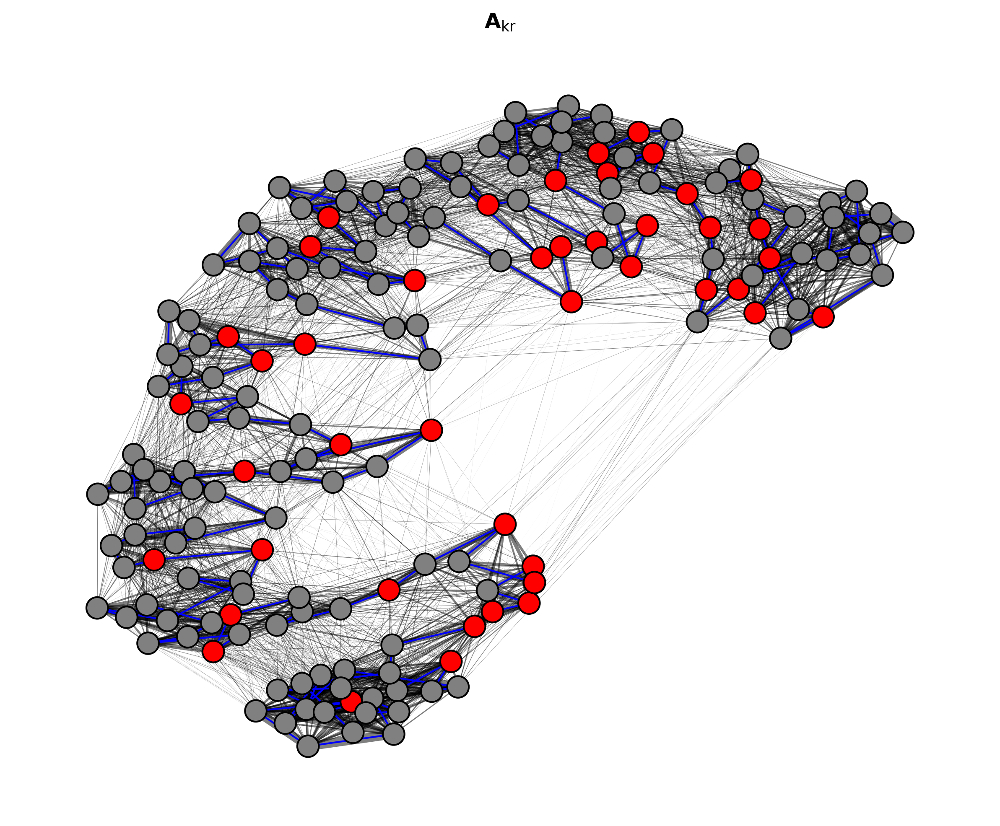

In [19]:
obsm_key = 'A_kr'
core_score = 'hge_logexp_RNA_weighted'
edge_threshold_quantile = 0.75
core_threshold_quantile = 0.75
order_threshold = 2

# plotting params
node_scale = 1.15
node_edgewidth = 1.0
edge_scale = 10
edge_alpha = 0.5
draw_linear = True

vector = adata.obs[core_score].values
threshold = np.quantile(vector, core_threshold_quantile)
core_nodes = adata.obs[adata.obs[core_score] > threshold].index.to_list()
print(f"n core nodes: {len(core_nodes)}")

node_attributes = adata.obs.copy()
node_attributes['core'] = node_attributes.index.isin(core_nodes)
node_attributes = node_attributes.to_dict(orient='index')

node_size = len(node_attributes) / node_scale,
print(f"{node_size=}")

# define the graph
A = adata.obsm[obsm_key].copy()
A = A.mask(np.eye(A.shape[0], dtype=bool), 0)
threshold = np.quantile(A, edge_threshold_quantile)
A[A < threshold] = 0
G = nx.from_pandas_adjacency(A)
nx.set_node_attributes(G, node_attributes)

# get consecutive edges
nodes = adata.obs.index.to_list()
ordered_nodes = list(zip(nodes, nodes[1:]))

G.pos = nx.spring_layout(G, seed=32)
print(G)

node_colors = ['red' if G.nodes[node]['core'] else 'grey' for node in G.nodes]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 8

nx.draw_networkx_nodes(
    G, 
    G.pos,
    node_size=node_size,
    node_color=node_colors,
    edgecolors='black', 
    linewidths=node_edgewidth,      
)

edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
edge_widths = ut.min_max(edge_widths) * edge_scale

nx.draw_networkx_edges(
    G, 
    G.pos,
    width=edge_widths,
    edge_color='k',
    alpha=edge_alpha,
)

if draw_linear:
    nx.draw_networkx_edges(
        G, 
        G.pos,
        edgelist=ordered_nodes,
        width=1,
        edge_color='blue',
    )

plt.title(r"$\mathbf{A}_{\text{kr}}$")
sns.despine(left=True, bottom=True)

# Identify most common hyperedges

H.shape=(44, 26)
26 hyperedges of order 5
average count counts['count'].mean()=1.0
                   hyperedge  count  is_consecutive        std
0  (130, 132, 151, 152, 163)      1           False  12.658594
1  (132, 144, 147, 148, 156)      1           False   7.787169
2    (34, 39, 119, 125, 127)      1           False  42.813082
3  (132, 143, 152, 154, 163)      1           False  10.533755
4   (69, 125, 129, 130, 132)      1           False  24.108090


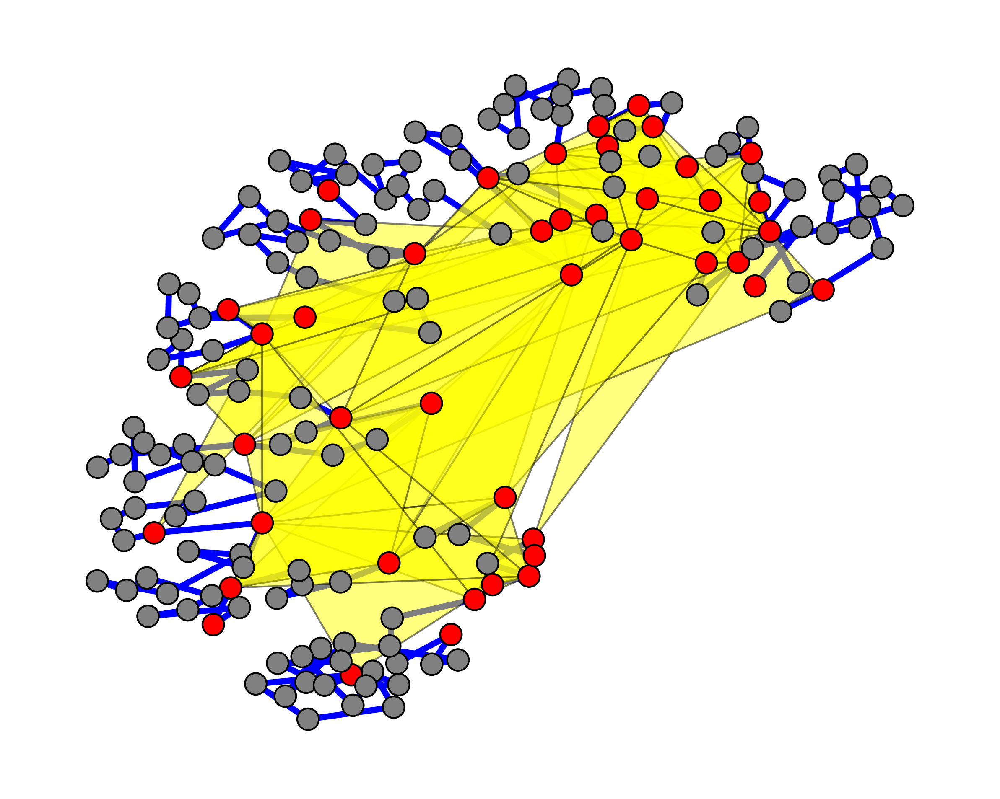

In [53]:
plot_n = 35
color = 'yellow'
order = 5
std_threshold = 1 # higher is longer range
remove_consecutive = False

def is_consecutive(tup):
  if len(tup) < 2:
    return True  # A tuple with 0 or 1 elements is considered consecutive

  for i in range(1, len(tup)):
    if tup[i] - tup[i - 1] != 1:
      return False
  return True

# get the hyperedges
H = adata[adata.obs.index.isin(core_nodes) > threshold].to_df()
H = H.loc[:, H.sum() == order]
print(f"{H.shape=}")

hyperedges = []
for col in H.columns:
    bins_present = set(H.index[H[col] == 1])
    bins_present = [int(x.split(":")[1]) for x in bins_present]
    hyperedges.append(sorted(bins_present))

# count them
counts = Counter(tuple(edge) for edge in hyperedges) 

counts = pd.DataFrame.from_dict(
    counts, 
    orient='index',
).reset_index()

counts.columns = ['hyperedge', 'count'] 
counts = counts.sort_values(by='count', ascending=False)
counts['is_consecutive'] = counts['hyperedge'].apply(lambda x : is_consecutive(x))
counts['std'] = counts['hyperedge'].apply(lambda x : np.std(x))

# remove consecutive and boring hyperedges
if remove_consecutive:
    counts = counts[~counts['is_consecutive']]
    
counts = counts[counts['std'] > std_threshold]
print(f"{len(counts)} hyperedges of order {order}")
print(f"average count {counts['count'].mean()=}")
print(counts.head())

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 8

nx.draw_networkx_nodes(
    G, 
    G.pos,
    node_size=node_size,
    node_color=node_colors,
    edgecolors='black', 
    linewidths=node_edgewidth,      
)

edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
edge_widths = ut.min_max(edge_widths) * edge_scale

if draw_linear:
    nx.draw_networkx_edges(
        G, 
        G.pos,
        edgelist=ordered_nodes,
        width=3.5,
        edge_color='blue',
)

# Plot filled polygons
ax = plt.gca()
for polygon_nodes in counts['hyperedge'].head(plot_n):
    polygon_coords = [G.pos[f"{chrom}:{node}"] for node in polygon_nodes]
    poly = patches.Polygon(
        polygon_coords, 
        closed=True, 
        alpha=0.5, 
        facecolor=color,
        edgecolor='k',
)  
    ax.add_patch(poly)

sns.despine(left=True, bottom=True)

In [10]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

# OE Normed

In [ ]:
# obsm_key = 'A_oe'
# core_score = 'hge_logexp_RNA_weighted'
# edge_threshold_quantile = 0.85
# core_threshold_quantile = 0.75
# order_threshold = 2

# vector = adata.obs[core_score].values
# threshold = np.quantile(vector, core_threshold_quantile)
# core_nodes = adata.obs[adata.obs[core_score] > threshold].index.to_list()

# node_attributes = adata.obs.copy()
# node_attributes['core'] = node_attributes.index.isin(core_nodes)
# node_attributes = node_attributes.to_dict(orient='index')

# # define the graph
# A = adata.obsm[obsm_key].copy()
# A = A.mask(np.eye(A.shape[0], dtype=bool), 0)
# threshold = np.quantile(A, edge_threshold_quantile)
# A[A < threshold] = 0
# G = nx.from_pandas_adjacency(A)
# nx.set_node_attributes(G, node_attributes)

# G.pos = nx.spring_layout(G)
# print(G)

# node_colors = ['red' if G.nodes[node]['core'] else 'grey' for node in G.nodes]

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 8, 8

# nx.draw_networkx_nodes(
#     G, 
#     G.pos,
#     node_size=45,
#     node_color=node_colors,
#     edgecolors='black', 
#     linewidths=0.5,      
# )

# nx.draw_networkx_edges(
#     G, 
#     G.pos,
#     width=[(d['weight']*0.1) for u, v, d in G.edges(data=True)],
#     edge_color='k',
#     alpha=0.3,
# )

# nx.draw_networkx_edges(
#     G, 
#     G.pos,
#     edgelist=ordered_nodes,
#     width=1,
#     edge_color='blue',
# )

# plt.title(r"$\mathbf{A}_{\text{oe}}$")
# sns.despine(left=True, bottom=True)

# Plot Features

In [ ]:
adata.obs.columns

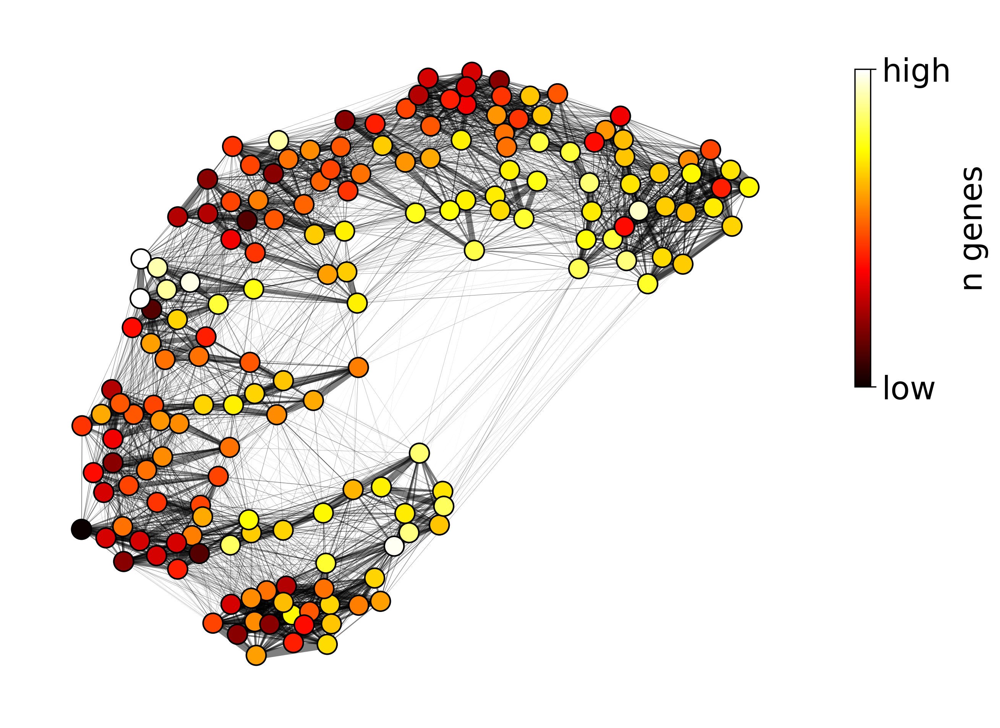

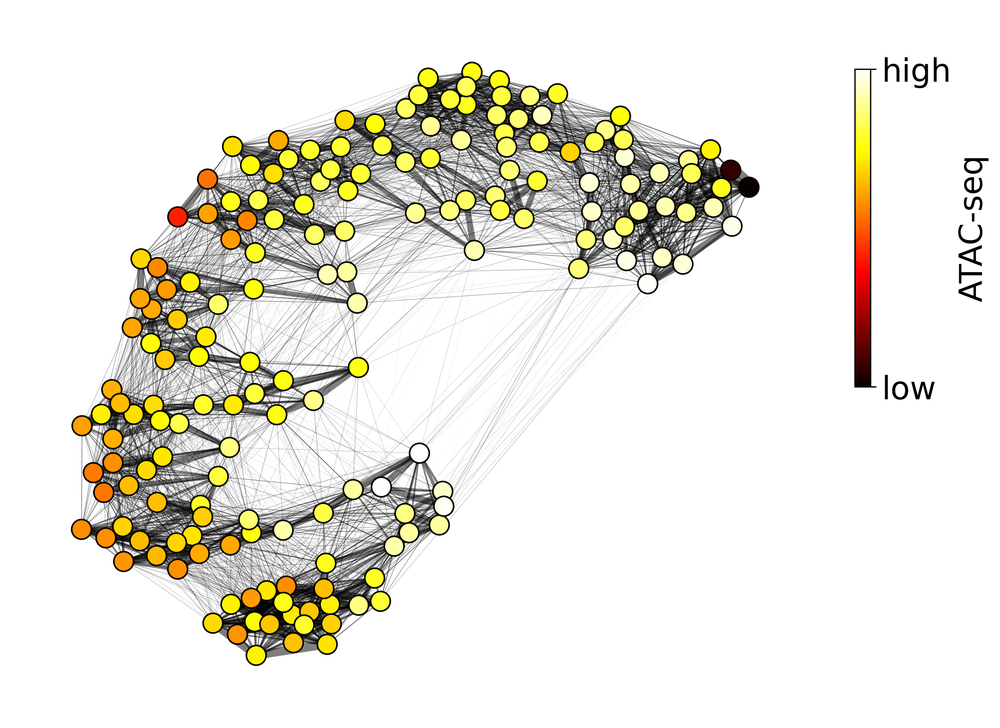

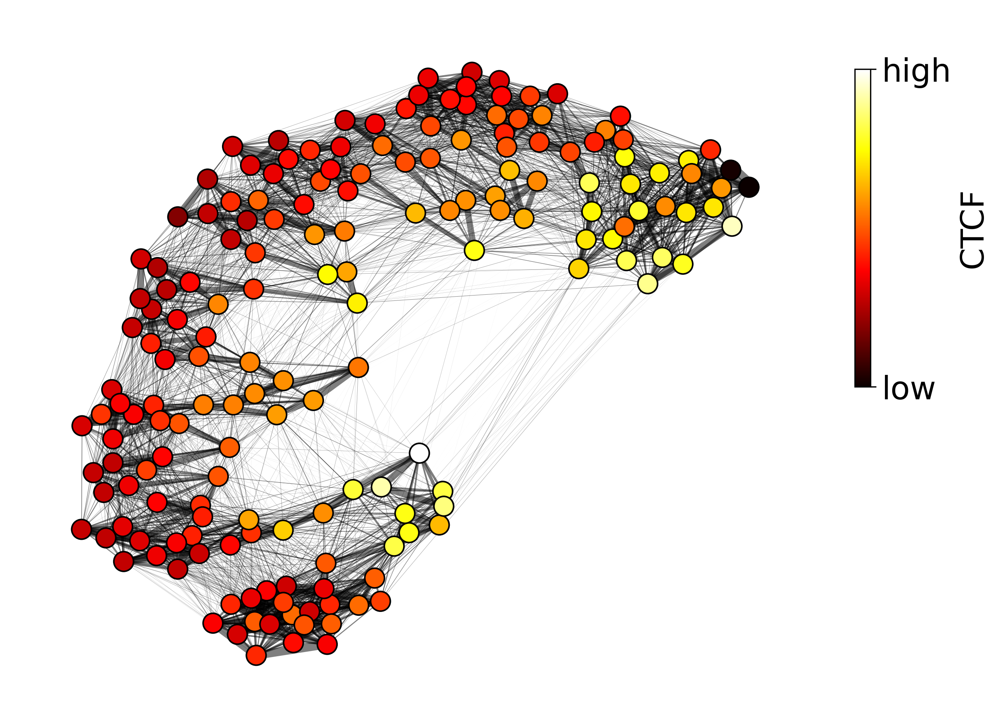

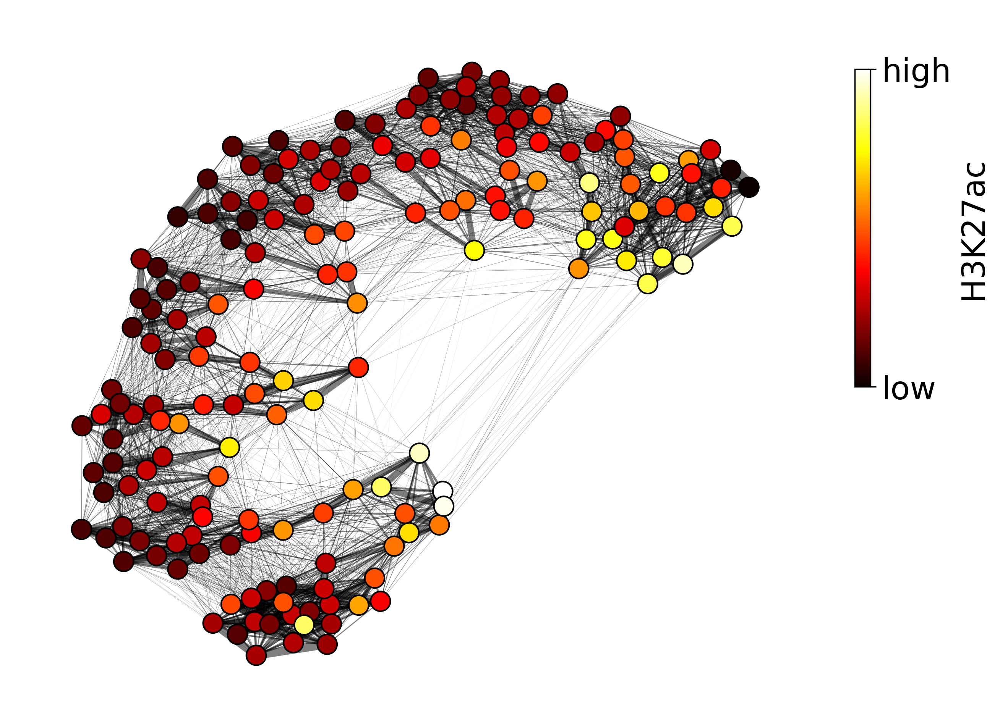

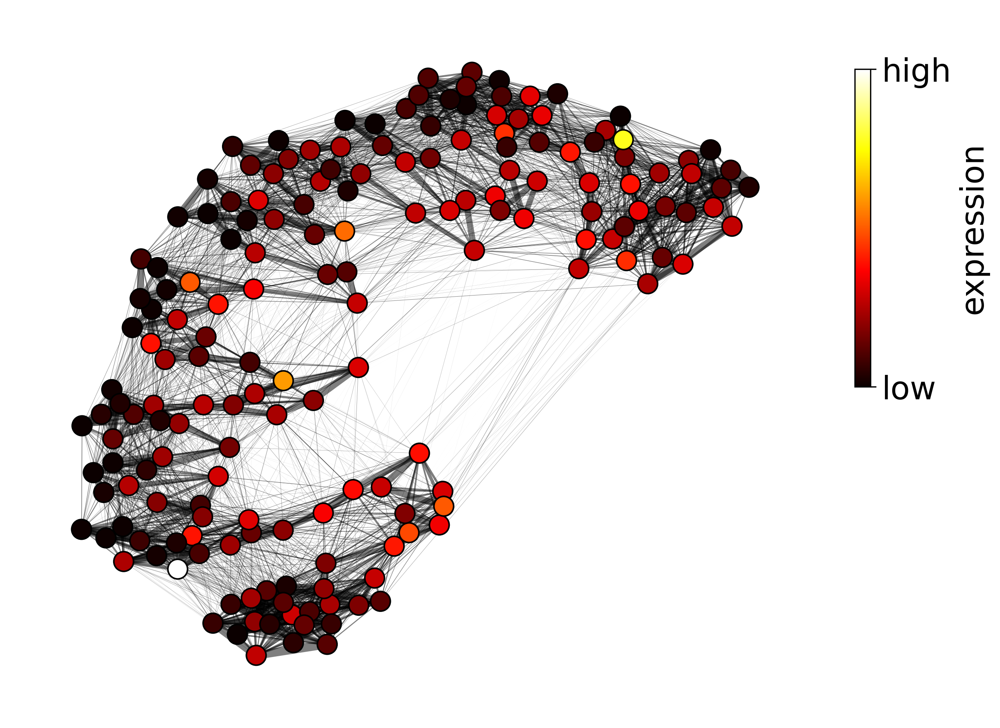

In [12]:
# # plotting params
# node_scale = 4
# node_edgewidth = 0.5
# edge_scale = 5
# edge_alpha = 0.5
draw_linear = False
fontsize = 20

plot_columns = {
    # 'chrom_degree' : 'hot',
    'n_genes' : 'hot',
    'ATACSeq_1' : 'hot',
    'CTCF' : 'hot',
    'H3K27ac' : 'hot',
    'RNA_5' : 'hot',
    # 'ce_eigenvector_centrality' : 'inferno',
    # 'hge_singular_vector_1' : 'inferno',
    # 'hge_logexp_unweighted' : 'inferno',
    # 'hge_logexp_RNA_weighted' : 'inferno',
}

labels = [
    'n genes',
    'ATAC-seq',
    'CTCF',
    'H3K27ac',
    'expression',
]


for i, (color_by, cmap) in enumerate(plot_columns.items()):

    node_colors = [np.log1p(G.nodes[node][color_by]) for node in G.nodes]

    edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
    edge_widths = ut.min_max(edge_widths) * edge_scale

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 10, 8
    
    nx.draw_networkx_nodes(
        G, 
        G.pos,
        node_size=len(node_attributes) / node_scale,
        node_color=node_colors,
        edgecolors='black', 
        linewidths=node_edgewidth,   
        cmap=cmap,
    )
    
    nx.draw_networkx_edges(
        G, 
        G.pos,
        width=edge_widths,
        edge_color='k',
        alpha=edge_alpha,
    )

    if draw_linear:
        nx.draw_networkx_edges(
            G, 
            G.pos,
            edgelist=ordered_nodes,
            width=1,
            edge_color='blue',
        )

    sns.despine(left=True, bottom=True)
    # plt.title(f"{chrom}:{color_by}")

    ax = plt.gca()
    divider = make_axes_locatable(ax)
    ax_cbar = divider.append_axes(
        "right", 
        size="10%",
        pad=0.001,
    ) 

    ticks = [min(node_colors), max(node_colors)]
    cbar = plt.colorbar(
        ScalarMappable(
            cmap=cmap, 
            norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors))),
        orientation='vertical',
        ax=ax_cbar,
        ticks=ticks,
        label=labels[i],
        shrink=0.45,
        anchor=(0.75, 0.85),
    )

    cbar.ax.set_yticklabels(['low', 'high'])
    cbar.ax.tick_params(labelsize=fontsize)  
    cbar.set_label(labels[i], fontsize=fontsize)
    ax_cbar.set_visible(False) 
    plt.show()
    # break
    

In [ ]:
?plt.colorbar